In [ ]:
##This cell is for downloading and preparing data from google drive
#-------------------------------------------------
#gdown is used for downloading dataset to storage
%%capture
!pip install gdown
#Downloading dataset
import gdown
file_id = ""  # Replace this with your file's ID
output_file = "data_file.zip"  # Replace "data_file.ext" with the desired output filename and extension
gdown.download(f"https://drive.google.com/uc?id={file_id}", output_file)
#Extracting zip file
!unzip data_file.zip

In [ ]:
#General Imports
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import keras

In [ ]:
#Numpy Random Seed for reproducability
np.random.seed(32)

In [ ]:
#Helper functions
def random_split_array(data, ratios=(0.8, 0.1, 0.1)):
    np.random.shuffle(data)  # Shuffle for randomness
    split_indices = np.cumsum(ratios[:-1]) * len(data)
    return np.split(data, split_indices.astype(int))

In [ ]:
#Train-test-val split
original = []
for i in range(131) :
    original.append(i)

train, test, val = random_split_array(original,(0.8,0.1,0.1))

#These arrays will contain paths of images, and liver mask
X_train = []
Y_train = []
X_test = []
Y_test = []
X_val = []
Y_val = []

scan_list = os.listdir("/content/Task03_Liver")
scan_list.sort()
for i in scan_list:
    num = int(i.split("_")[-1])
    path = "/content/Task03_Liver/" + i
    imgpath = path + "/images"
    maskpath = path + "/masks"
    piclist = os.listdir(imgpath)
    if num in train:
        for j in piclist:
            X_train.append(imgpath + "/" + j)
            Y_train.append(maskpath + "/liver/" +j)
    elif num in test:
        for j in piclist:
            X_test.append(imgpath + "/" + j)
            Y_test.append(maskpath + "/liver/" +j)
    else:
        for j in piclist:
            X_val.append(imgpath + "/" + j)
            Y_val.append(maskpath + "/liver/" +j)



In [ ]:
#This function will convert the path to the actual image by loading it from the memory.
def load_and_preprocess(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=1)  # Or the format of your images
    image = tf.image.resize(image, [256, 256])
    image = tf.cast(image, tf.float32) / 255.0
    return image

#Generating tf datasets
image_ds = tf.data.Dataset.from_tensor_slices(X_train)
image_ds = image_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask_ds = tf.data.Dataset.from_tensor_slices(Y_train)
mask_ds = mask_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
train_ds = tf.data.Dataset.zip((image_ds,mask_ds))

image1_ds = tf.data.Dataset.from_tensor_slices(X_val)
image1_ds = image1_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask1_ds = tf.data.Dataset.from_tensor_slices(Y_val)
mask1_ds = mask1_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
val_ds = tf.data.Dataset.zip((image1_ds,mask1_ds))

image2_ds = tf.data.Dataset.from_tensor_slices(X_test)
image2_ds = image2_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
mask2_ds = tf.data.Dataset.from_tensor_slices(Y_test)
mask2_ds = mask2_ds.map(load_and_preprocess, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = tf.data.Dataset.zip((image2_ds,mask2_ds))

In [ ]:
#Defining various parts of UNet and combining them together
#This UNet implementation is similar to the original implementation in Ronneberger(2015). The only difference is here padding is 'same' instead of 'valid', to maintain same shape of input image and output mask,
#else output mask has different dimensions as compared to input image

def encoder_block(inputs, num_filters):
    # Convolution with 3x3 filter followed by ReLU activation
    x = keras.layers.Conv2D(num_filters,3,padding = 'same')(inputs)
    x = keras.layers.Activation('relu')(x)
    # Convolution with 3x3 filter followed by ReLU activation
    x = keras.layers.Conv2D(num_filters,3,padding = 'same')(x)
    x = keras.layers.Activation('relu')(x)
    # Max Pooling with 2x2 filter
    x = keras.layers.MaxPool2D(pool_size = (2, 2), strides = 2)(x)
    return x

def decoder_block(inputs, skip_features, num_filters):
    # Upsampling with 2x2 filter
    x = keras.layers.Conv2DTranspose(num_filters, (2, 2),strides = 2,padding = 'same')(inputs)
    # Copy and crop the skip features
    # to match the shape of the upsampled input
    x = keras.layers.Concatenate()([x, skip_features])
    # Convolution with 3x3 filter followed by ReLU activation
    x = keras.layers.Conv2D(num_filters,3,padding = 'same')(x)
    x = keras.layers.Activation('relu')(x)
    # Convolution with 3x3 filter followed by ReLU activation
    x = keras.layers.Conv2D(num_filters, 3, padding = 'same')(x)
    x = keras.layers.Activation('relu')(x)
    return x



def unet_model(input_shape = (256, 256, 3), num_classes = 1):
    inputs = tf.keras.layers.Input(input_shape)
    # Contracting Path
    s1 = encoder_block(inputs, 64)
    s2 = encoder_block(s1, 128)
    s3 = encoder_block(s2, 256)
    s4 = encoder_block(s3, 512)
    print(s4.shape)
    # Bottleneck
    b1 = tf.keras.layers.Conv2D(1024, 3, padding = 'same')(s4)
    b1 = tf.keras.layers.Activation('relu')(b1)
    b1 = tf.keras.layers.Conv2D(1024, 3, padding = 'same')(b1)
    b1 = tf.keras.layers.Activation('relu')(b1)
    print(b1.shape)
    # Expansive Path
    s5 = decoder_block(b1, s3, 512)
    s6 = decoder_block(s5, s2, 256)
    s7 = decoder_block(s6, s1, 128)
    s8 = decoder_block(s7, inputs, 64)
    # Output
    outputs = tf.keras.layers.Conv2D(num_classes, 1, padding = 'same', activation = 'sigmoid')(s8)
    model = tf.keras.models.Model(inputs = inputs, outputs = outputs,name = 'U-Net')
    return model




In [ ]:
model = unet_model((256,256,1),1)
model.summary()

(None, 16, 16, 512)
(None, 16, 16, 1024)
Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_19 (Conv2D)          (None, 256, 256, 64)         640       ['input_2[0][0]']             
                                                                                                  
 activation_18 (Activation)  (None, 256, 256, 64)         0         ['conv2d_19[0][0]']           
                                                                                                  
 conv2d_20 (Conv2D)          (None, 256, 256, 64)         36928     ['activation_18[0][0]']       
                                                     

In [ ]:
#Defining dice loss functions. dice is actual dice-function value, while dice_loss is 1-dice. if dice_loss is minimized, dice is maximized.
def dice_loss(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator + 1e-1)
    return 1 - dice

def dice(y_true,y_pred):
    y_true = tf.cast(y_true, tf.float32)
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    dice = numerator / (denominator + 1e-20)
    return dice

In [ ]:
#General callbacks
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
weight_path="{}.weights.h5.keras".format('cxr_reg')

checkpoint = ModelCheckpoint(weight_path, monitor='val_loss', verbose=1,
                             save_best_only=True, mode='min', save_weights_only = False)

reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                                   patience=5,
                                   verbose=1, mode='min', epsilon=0.0001, cooldown=2, min_lr=1e-8)
early = EarlyStopping(monitor="val_loss",
                      mode="min",
                      patience=10) # probably needs to be more patient, but kaggle time is limited
callbacks_list = [checkpoint, early, reduceLROnPlat]

In [ ]:
BATCH_SIZE = 32
train_ds = train_ds.shuffle(buffer_size=1000)  # Shuffle dataset for better training
train_ds = train_ds.batch(BATCH_SIZE)
train_ds = train_ds.prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE)

In [ ]:
#Adam optimizer, learning rate = 1e-5
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5), loss=dice_loss, metrics = [dice])

In [ ]:
#Training the Model
history = model.fit(train_ds,
    epochs=20,
    validation_data=val_ds,
    callbacks = callbacks_list,
)

Epoch 1/20
467/467 [==============================] - ETA: 0s - loss: 0.4541 - dice: 0.5462
Epoch 1: val_loss improved from inf to 0.16301, saving model to cxr_reg.weights.h5.keras
467/467 [==============================] - 82s 161ms/step - loss: 0.4541 - dice: 0.5462 - val_loss: 0.1630 - val_dice: 0.8364 - lr: 1.0000e-05
Epoch 2/20
467/467 [==============================] - ETA: 0s - loss: 0.1172 - dice: 0.8828
Epoch 2: val_loss improved from 0.16301 to 0.14322, saving model to cxr_reg.weights.h5.keras
467/467 [==============================] - 75s 161ms/step - loss: 0.1172 - dice: 0.8828 - val_loss: 0.1432 - val_dice: 0.8568 - lr: 1.0000e-05
Epoch 3/20
467/467 [==============================] - ETA: 0s - loss: 0.0975 - dice: 0.9025
Epoch 3: val_loss improved from 0.14322 to 0.11688, saving model to cxr_reg.weights.h5.keras
467/467 [==============================] - 76s 161ms/step - loss: 0.0975 - dice: 0.9025 - val_loss: 0.1169 - val_dice: 0.8833 - lr: 1.0000e-05
Epoch 4/20
467/467 [

In [ ]:
#Loading best validation weights for testing further
model.load_weights("/content/cxr_reg.weights.h5.keras")

In [ ]:
#Generating test arrays from test_ds
Xts =[]
Yts =[]
for i in test_ds:
    x,y=i
    Xts.append(x)
    Yts.append(y)

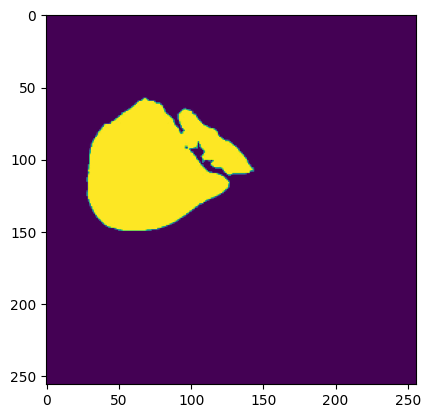

In [ ]:
#checking image mask pair correspondance
#This is mask
plt.imshow(Yts[17])

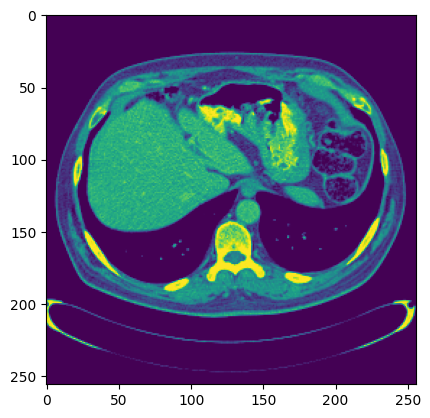

In [ ]:
#This is corresponding image
plt.imshow(Xts[17])

In [ ]:
#Evaluating model on test dataset
model.evaluate(np.array(Xts),np.array(Yts))

63/63 [==============================] - 4s 60ms/step - loss: 0.0794 - dice: 0.9210


[0.07944776862859726, 0.920965850353241]

In [ ]:
#This shows the image having the best accuracy. The variable bi stores the index such that dice(model(Xts[bi]),Yts[bi]) is max.
#Execute this only for visualization purposes only, as it takes some time to manually iterate through entire test dataset.
%%capture
mx = 0
bi = 0
for i in range(len(Xts)):
    y = np.array([Xts[i]])
    z = model.predict(y)
    if dice(z[0],Yts[i]) > mx:
        mx = dice(z[0],Yts[i])
        bi = i

In [ ]:
print("Best dice value occures at index: ",bi," with a value of: ",mx)

Best dice value occures at index:  690  with a value of:  tf.Tensor(0.97462165, shape=(), dtype=float32)


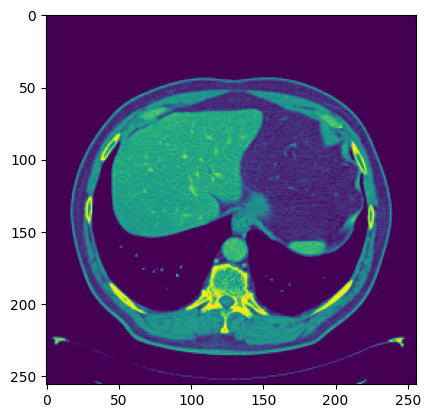

In [ ]:
#Input image of best case
plt.imshow(Xts[bi])

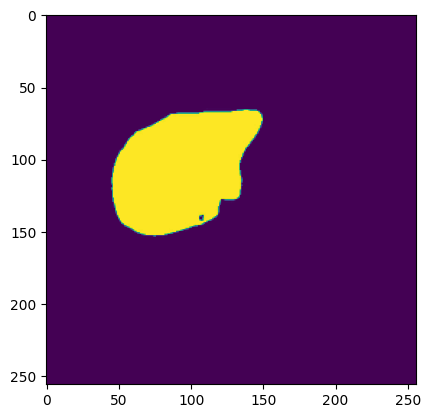

In [ ]:
#Ground truth of best case
plt.imshow(Yts[bi])

1/1 [==============================] - 0s 23ms/step


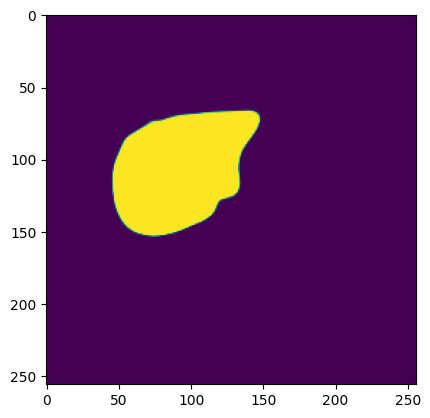

In [ ]:
#Predicted mask of best case
z = model.predict(np.array([Xts[bi]]))
plt.imshow(z[0])

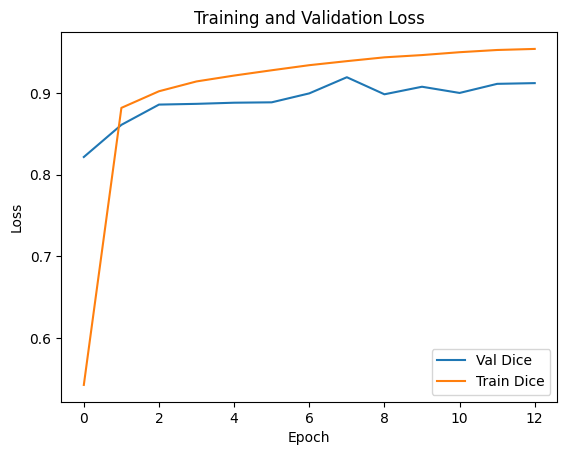

In [ ]:
#Training and validation loss curves
plt.plot(history.history['val_dice'], label='Val Dice')
plt.plot(history.history['dice'], label='Train Dice')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

['/content/Task03_Liver/liver_42/images/47.jpg', '/content/Task03_Liver/liver_100/images/597.jpg', '/content/Task03_Liver/liver_100/images/653.jpg', '/content/Task03_Liver/liver_65/images/324.jpg', '/content/Task03_Liver/liver_34/images/104.jpg', '/content/Task03_Liver/liver_24/images/193.jpg', '/content/Task03_Liver/liver_84/images/483.jpg', '/content/Task03_Liver/liver_65/images/392.jpg', '/content/Task03_Liver/liver_121/images/269.jpg', '/content/Task03_Liver/liver_42/images/90.jpg', '/content/Task03_Liver/liver_65/images/329.jpg', '/content/Task03_Liver/liver_42/images/74.jpg', '/content/Task03_Liver/liver_42/images/33.jpg', '/content/Task03_Liver/liver_42/images/106.jpg', '/content/Task03_Liver/liver_34/images/136.jpg', '/content/Task03_Liver/liver_84/images/564.jpg', '/content/Task03_Liver/liver_84/images/553.jpg', '/content/Task03_Liver/liver_65/images/450.jpg', '/content/Task03_Liver/liver_35/images/84.jpg', '/content/Task03_Liver/liver_84/images/403.jpg', '/content/Task03_Live

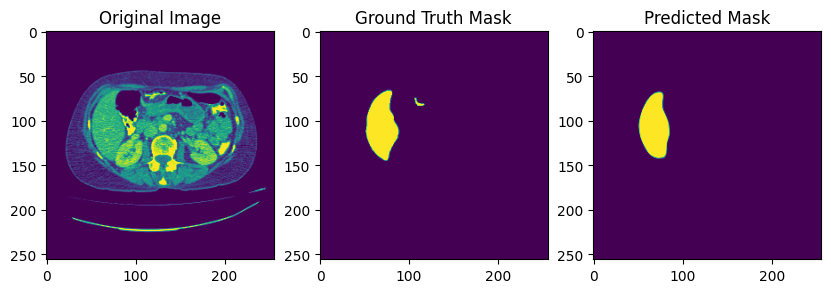

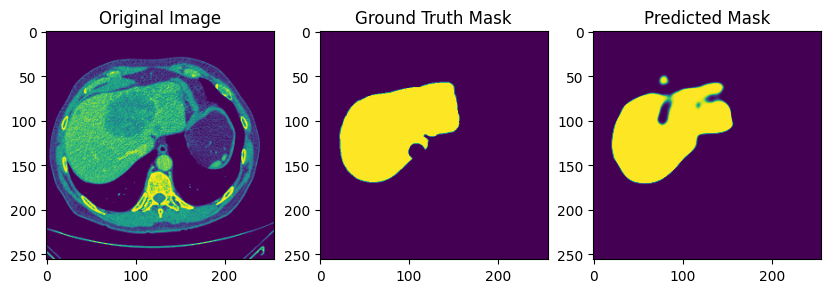

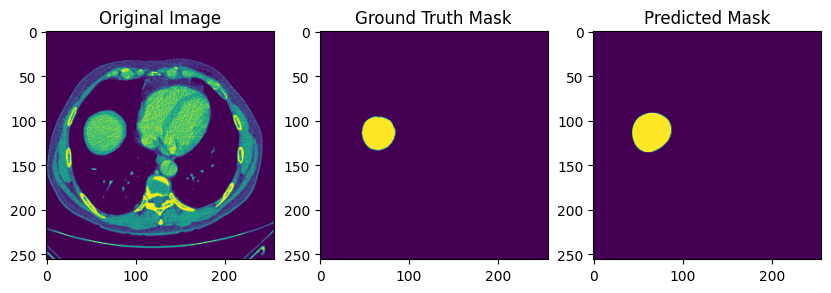

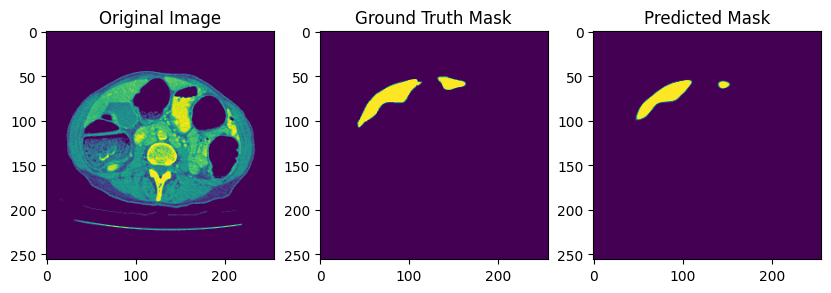

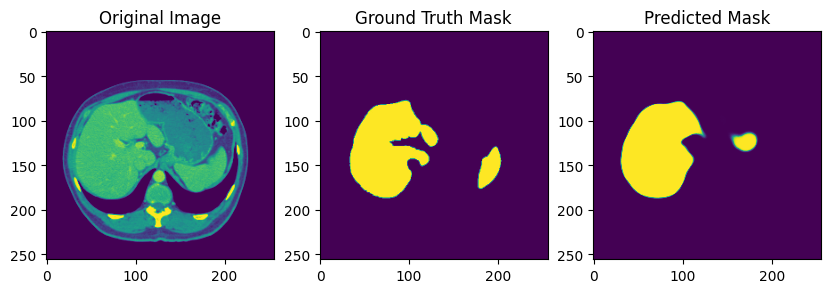

...

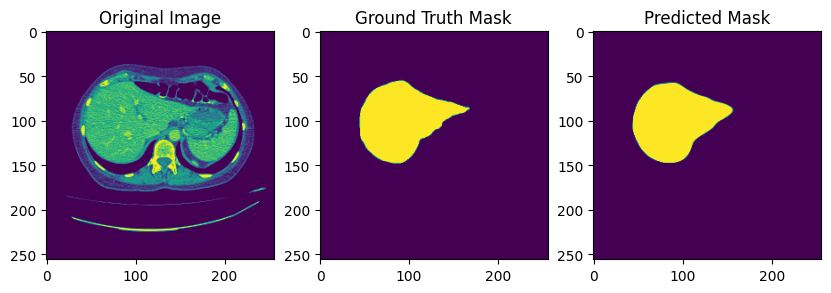

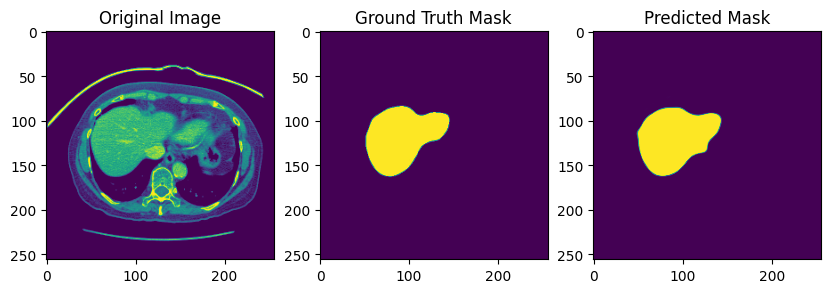

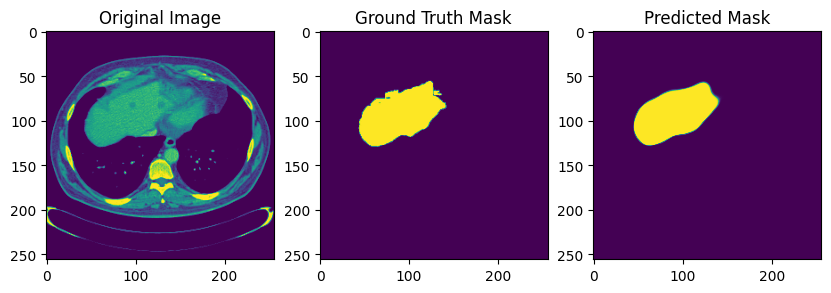

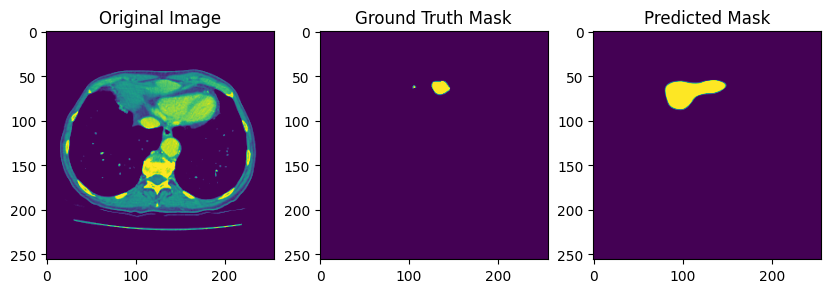

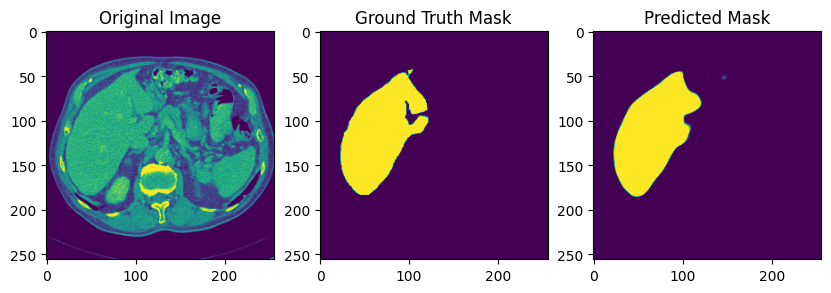

In [ ]:
##This section chooses 100 random images from X_test and Y_test and shows the model output on them, along with input and ground truth
import random
# Select 100 random images from X_test and Y_test
random_indices = random.sample(range(len(X_test)), 100)
selected_X_test = [X_test[i] for i in random_indices]
selected_Y_test = [Y_test[i] for i in random_indices]
print(selected_X_test)
g = lambda x:load_and_preprocess(x)
imgs = [g(x) for x in selected_X_test]
# Evaluate the model on the selected images
y_pred = model.predict(np.array(imgs))

# Compare the model output and Y
for i in range(100):
  plt.figure(figsize=(10, 5))

  # Original image
  plt.subplot(1, 3, 1)
  plt.imshow(g(selected_X_test[i]))
  plt.title('Original Image')

  # Ground truth mask
  plt.subplot(1, 3, 2)
  plt.imshow(g(selected_Y_test[i]))
  plt.title('Ground Truth Mask')

  # Predicted mask
  plt.subplot(1, 3, 3)
  plt.imshow(y_pred[i])
  plt.title('Predicted Mask')

  plt.show()


In [ ]:
!zip /content/wts.zip /content/cxr_reg.weights.h5.keras

  adding: content/cxr_reg.weights.h5.keras (deflated 7%)


In [ ]:
!cp /content/wts.zip /content/drive/MyDrive